# Preprocessing

In [ ]:
import scanpy as sc
import pandas as pd
import os

In [ ]:
data = pd.read_csv("WT_ROT.tsv", sep="\t", index_col=0)
adata = sc.AnnData(X=data.T)  # Transpose to make cells rows and genes columns
adata.obs['Cell_line'] = 'WT'
adata.obs['Treatment'] = 'ROT'
print(adata)

AnnData object with n_obs × n_vars = 1556 × 33694


In [ ]:
set(['_'.join(x.split('_')[:1]) + '_' for x in files if 'ipynb' not in x])

{'WT_'}

In [ ]:
for prefix in set(['_'.join(x.split('_')[:3]) + '_' for x in files if 'tar' not in x]):
    adata = sc.read_10x_mtx('extracted_files/',prefix=prefix)
    adata.write_h5ad('raw_h5ad_files_Dec15/' + prefix + '.h5ad')

### QC for 1 sample

In [ ]:
adata.obs['Cell_line'] = 'WT'

In [ ]:
adata.obs['Treatment'] = 'ROT'

In [ ]:
adata.obs.head()

,Cell_line,Treatment
AAACCTGAGCTAGTCT-1,WT,ROT
AAACCTGAGTCGTACT-1,WT,ROT
AAACCTGAGTGAAGAG-1,WT,ROT
AAACCTGAGTTTGCGT-1,WT,ROT
AAACCTGCATTACCTT-1,WT,ROT


In [ ]:
adata.X.max()

8608.0

In [ ]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')

In [ ]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

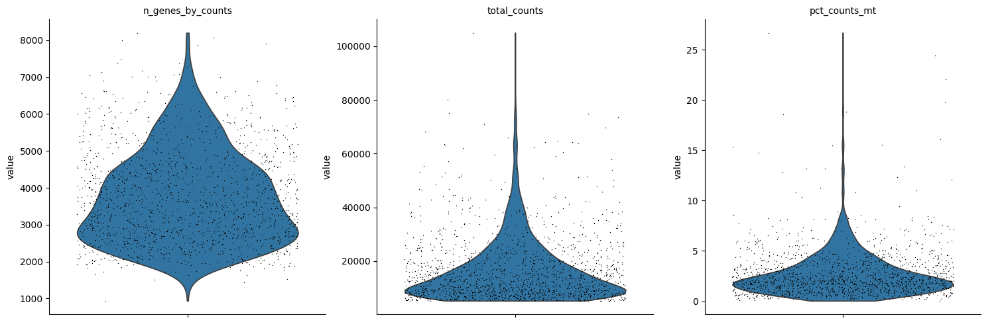

In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

In [ ]:
adata

AnnData object with n_obs × n_vars = 1556 × 33694
    obs: 'Cell_line', 'Treatment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

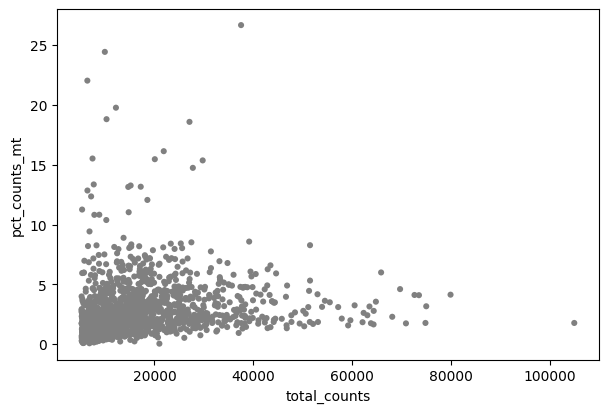

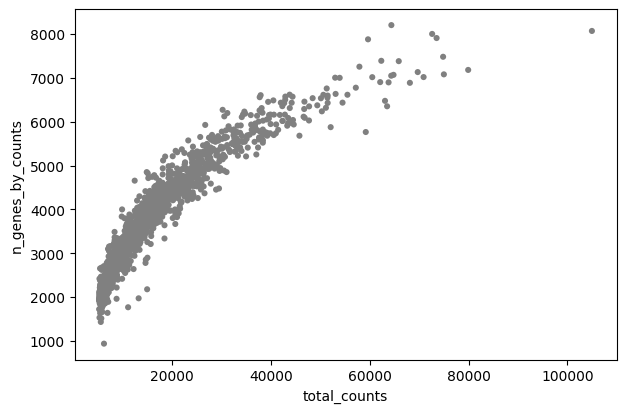

In [ ]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [ ]:
adata

AnnData object with n_obs × n_vars = 1556 × 33694
    obs: 'Cell_line', 'Treatment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [ ]:
import scvi
scvi.settings.seed= 0

Seed set to 0


In [ ]:
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.highly_variable_genes(adata, n_top_genes=2000, subset=True, flavor='seurat_v3')
scvi.model.SCVI.setup_anndata(adata)
vae = scvi.model.SCVI(adata)
vae.train()
solo = scvi.external.SOLO.from_scvi_model(vae)
solo.train()
df = solo.predict()
df['prediction'] = solo.predict(soft=False)
df.index = df.index.map(lambda x: x[:-2])  # Modify index mapping as required
df['dif'] = df.doublet - df.singlet
doublets = df[(df.prediction == 'doublet') & (df.dif > 1)]

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [00:58<00:00,  7.11it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [00:58<00:00,  6.81it/s, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 388/400:  97%|▉| 388/400 [00:14<00:00, 27.10it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.179. Signaling Trainer to stop.


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


In [ ]:
doublets = df[(df.prediction == 'doublet') & (df.dif > 0.5)]
doublets

,doublet,singlet,prediction,dif
AAAGCAACAATCCAAC,0.860972,0.139028,doublet,0.721945
AAATGCCCAAACGTGG,0.792201,0.207798,doublet,0.584403
AACCGCGGTTTACTCT,0.962040,0.037960,doublet,0.924080
AACGTTGTCGTCACGG,0.824330,0.175670,doublet,0.648659
AAGACCTTCAAGGCTT,0.819798,0.180202,doublet,0.639596
...,...,...,...,...
TTAGGACTCAACGGGA,0.765937,0.234063,doublet,0.531873
TTCTCAACATTCCTGC,0.792190,0.207810,doublet,0.584379
TTGACTTTCGTCCAGG,0.838599,0.161401,doublet,0.677198
TTGTAGGAGCTAGTGG,0.996015,0.003985,doublet,0.992031


In [ ]:
len(doublets)

97

In [ ]:
import scanpy as sc
import scvi
import seaborn as sns
import numpy as np
import pandas as pd
import torch
import os

In [ ]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.1.6.post2


In [ ]:
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
#save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

In [ ]:
ribo_url = "http://software.broadinstitute.org/gsea/msigdb/download_geneset.jsp?geneSetName=KEGG_RIBOSOME&fileType=txt"
ribo_genes = pd.read_table(ribo_url, skiprows=2, header=None)

## scVI_SOLO 

In [ ]:
def pp(file_path):
    file_name = os.path.basename(file_path)
    print(f"Processing file: {file_name}")

    # Load the data
    data = pd.read_csv(file_path, sep="\t", index_col=0)
    # Create an AnnData object and transpose the data
    adata = sc.AnnData(X=data.T)  # Transpose: cells as rows, genes as columns

    # Filter genes and cells, and annotate as needed
    print(f"Running SCVI and SOLO pipeline for: {file_name}")
    sc.pp.filter_genes(adata, min_cells=10)
    sc.pp.highly_variable_genes(adata, n_top_genes=2000, subset=True, flavor='seurat_v3')
    scvi.model.SCVI.setup_anndata(adata)
    vae = scvi.model.SCVI(adata)
    vae.train()
    solo = scvi.external.SOLO.from_scvi_model(vae)
    solo.train()
    df = solo.predict()
    df['prediction'] = solo.predict(soft=False)
    df.index = df.index.map(lambda x: x[:-2])  # Modify index mapping as required
    df['dif'] = df.doublet - df.singlet
    doublets = df[(df.prediction == 'doublet') & (df.dif > 1)]

    # Check if doublets dataframe is empty
    if doublets.empty:
        print(f"No doublets detected in: {file_name}")
    else:
        print(f"Doublets detected in: {file_name}, count: {len(doublets)}")

    # Reload data to remove doublets
    print(f"Removing doublets for: {file_name}")
    data = pd.read_csv(file_path, sep="\t", index_col=0)
    adata = sc.AnnData(X=data.T)
    parts = file_name.replace('.tsv', '').split('_')
    adata.obs['Cell_line'] = parts[0]
    adata.obs['Treatment'] = parts[1] if len(parts) > 1 else 'Unknown'
    adata.obs['ID'] = file_name.replace('.tsv', '')  # Use full file name without extension
    adata.obs['doublet'] = adata.obs.index.isin(doublets.index)
    adata = adata[~adata.obs.doublet]

    # Perform further filtering and annotations
    print(f"Running QC steps for: {file_name}")
    sc.pp.filter_cells(adata, min_genes=200)  # Filter cells with fewer than 200 genes
    sc.pp.filter_genes(adata, min_cells=3)  # Filter genes found in fewer than 3 cells
    adata.var['mt'] = adata.var_names.str.startswith('mt-')  # Annotate mitochondrial genes
    adata.var['ribo'] = adata.var_names.isin(ribo_genes[0].values)  # Annotate ribosomal genes
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)

    # Apply QC thresholds
    upper_lim = np.quantile(adata.obs.n_genes_by_counts.values, 0.98)
    adata = adata[adata.obs.n_genes_by_counts < upper_lim]
    adata = adata[adata.obs.pct_counts_mt < 15]
    adata = adata[adata.obs.pct_counts_ribo < 2]

    print(f"Finished processing: {file_name}")
    return adata

In [ ]:
# Run to make adata list
adata_list = []
for file in os.listdir('Processed_tsv/'):
    adata_list.append(pp(os.path.join('Processed_tsv', file)))

Processing file: HE_UNT.tsv
Running SCVI and SOLO pipeline for: HE_UNT.tsv


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [02:02<00:00,  3.44it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [02:02<00:00,  3.26it/s, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 304/400:  76%|▊| 304/400 [00:23<00:07, 12.95it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.157. Signaling Trainer to stop.
No doublets detected in: HE_UNT.tsv
Removing doublets for: HE_UNT.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: HE_UNT.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: HE_UNT.tsv
Processing file: HE_ROT.tsv
Running SCVI and SOLO pipeline for: HE_ROT.tsv


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [02:46<00:00,  2.34it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [02:46<00:00,  2.40it/s, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 237/400:  59%|▌| 237/400 [00:23<00:16, 10.00it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.168. Signaling Trainer to stop.
No doublets detected in: HE_ROT.tsv
Removing doublets for: HE_ROT.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: HE_ROT.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: HE_ROT.tsv
Processing file: HE_TUN.tsv
Running SCVI and SOLO pipeline for: HE_TUN.tsv


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [02:24<00:00,  2.32it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [02:24<00:00,  2.77it/s, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 320/400:  80%|▊| 320/400 [00:28<00:07, 11.20it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.190. Signaling Trainer to stop.
No doublets detected in: HE_TUN.tsv
Removing doublets for: HE_TUN.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: HE_TUN.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: HE_TUN.tsv
Processing file: WT_TUN.tsv
Running SCVI and SOLO pipeline for: WT_TUN.tsv


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [01:58<00:00,  3.40it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [01:58<00:00,  3.38it/s, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [00:28<00:00, 14.31it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [00:28<00:00, 14.16it/s, v_num=1, train_loss_step
No doublets detected in: WT_TUN.tsv
Removing doublets for: WT_TUN.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: WT_TUN.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: WT_TUN.tsv
Processing file: WT_ROT.tsv
Running SCVI and SOLO pipeline for: WT_ROT.tsv


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [01:11<00:00,  5.51it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [01:11<00:00,  5.63it/s, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 286/400:  72%|▋| 286/400 [00:12<00:04, 23.42it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.176. Signaling Trainer to stop.
No doublets detected in: WT_ROT.tsv
Removing doublets for: WT_ROT.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: WT_ROT.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: WT_ROT.tsv
Processing file: WT_UNT.tsv
Running SCVI and SOLO pipeline for: WT_UNT.tsv


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [02:11<00:00,  3.01it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [02:11<00:00,  3.03it/s, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 352/400:  88%|▉| 352/400 [00:28<00:03, 12.33it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.219. Signaling Trainer to stop.
No doublets detected in: WT_UNT.tsv
Removing doublets for: WT_UNT.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: WT_UNT.tsv


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: WT_UNT.tsv


In [ ]:
# Inspect the processed AnnData objects
for adata in adata_list:
    print(adata)

View of AnnData object with n_obs × n_vars = 12 × 20186
    obs: 'Cell_line', 'Treatment', 'ID', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_cells', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
View of AnnData object with n_obs × n_vars = 1 × 20131
    obs: 'Cell_line', 'Treatment', 'ID', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_cells', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
View of AnnData object with n_obs × n_vars = 2 × 19087
    obs: 'Cell_line', 'Treatment', 'ID', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_cells', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_cou

In [ ]:
len(adata_list)

6

In [ ]:
adata_list[0].obs

,Cell_line,Treatment,ID,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
AGCAGCCCACTGCCAG-1,HE,UNT,HE_UNT,False,1899,1899,4179.0,0.0,0.0,82.0,1.962192
CTAGTGAGTTATGTGC-1,HE,UNT,HE_UNT,False,2540,2538,9483.0,0.0,0.0,127.0,1.339239
CTAGTGATCACAATGC-1,HE,UNT,HE_UNT,False,1699,1698,3962.0,0.0,0.0,66.0,1.665825
GGCCGATGTTACGTCA-1,HE,UNT,HE_UNT,False,1597,1596,4986.0,0.0,0.0,50.0,1.002808
GGGCACTAGTCGAGTG-1,HE,UNT,HE_UNT,False,1643,1643,3601.0,0.0,0.0,71.0,1.971675
GTCACGGAGCAGACTG-1,HE,UNT,HE_UNT,False,2617,2617,8566.0,0.0,0.0,167.0,1.949568
TAAACCGTCCGTACAA-1,HE,UNT,HE_UNT,False,1653,1653,3464.0,0.0,0.0,66.0,1.905312
TATCTCAAGACTGTAA-1,HE,UNT,HE_UNT,False,1103,1103,3654.0,0.0,0.0,70.0,1.915709
TCTTTCCCAGTCGATT-1,HE,UNT,HE_UNT,False,1832,1828,3916.0,0.0,0.0,77.0,1.966292
TGAGCCGTCTCATTCA-1,HE,UNT,HE_UNT,False,1165,1165,3876.0,0.0,0.0,59.0,1.522188


In [ ]:
adata = sc.concat(adata_list)

In [ ]:
adata

AnnData object with n_obs × n_vars = 19 × 17480
    obs: 'Cell_line', 'Treatment', 'ID', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'

## QC and concat

In [ ]:
def pp(file_path):
    file_name = os.path.basename(file_path)
    print(f"Processing file: {file_name}")

    # Load the data
    data = pd.read_csv(file_path, sep="\t", index_col=0)
    # Create an AnnData object and transpose the data
    adata = sc.AnnData(X=data.T)  # Transpose: cells as rows, genes as columns

    # Add metadata
    parts = file_name.replace('.tsv', '').split('_')
    adata.obs['Cell_line'] = parts[0]
    adata.obs['Treatment'] = parts[1] if len(parts) > 1 else 'Unknown'
    adata.obs['ID'] = file_name.replace('.tsv', '')  # Use full file name without extension

    # Perform further filtering and annotations
    print(f"Running QC steps for: {file_name}")
    sc.pp.filter_cells(adata, min_genes=200)  # Filter cells with fewer than 200 genes
    sc.pp.filter_genes(adata, min_cells=3)  # Filter genes found in fewer than 3 cells
    adata.var['mt'] = adata.var_names.str.startswith('mt-')  # Annotate mitochondrial genes
    #adata.var['ribo'] = adata.var_names.isin(ribo_genes[0].values)  # Annotate ribosomal genes
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

    # Apply QC thresholds
    upper_lim = np.quantile(adata.obs.n_genes_by_counts.values, 0.98)
    adata = adata[adata.obs.n_genes_by_counts < upper_lim]
    adata = adata[adata.obs.pct_counts_mt < 10]
    #adata = adata[adata.obs.pct_counts_ribo < 2]

    print(f"Finished processing: {file_name}")
    return adata


In [ ]:
# Run to make adata list
adata_list = []
for file in os.listdir('Processed_tsv/'):
    adata_list.append(pp(os.path.join('Processed_tsv', file)))

Processing file: HE_UNT.tsv
Running QC steps for: HE_UNT.tsv
Finished processing: HE_UNT.tsv
Processing file: HE_ROT.tsv
Running QC steps for: HE_ROT.tsv
Finished processing: HE_ROT.tsv
Processing file: HE_TUN.tsv
Running QC steps for: HE_TUN.tsv
Finished processing: HE_TUN.tsv
Processing file: WT_TUN.tsv
Running QC steps for: WT_TUN.tsv
Finished processing: WT_TUN.tsv
Processing file: WT_ROT.tsv
Running QC steps for: WT_ROT.tsv
Finished processing: WT_ROT.tsv
Processing file: WT_UNT.tsv
Running QC steps for: WT_UNT.tsv
Finished processing: WT_UNT.tsv


In [ ]:
# Inspect the processed AnnData objects
for adata in adata_list:
    print(adata)

View of AnnData object with n_obs × n_vars = 3080 × 20186
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
View of AnnData object with n_obs × n_vars = 4175 × 20131
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
View of AnnData object with n_obs × n_vars = 3380 × 19087
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
View of AnnData object with n_obs × n_vars = 2673 × 19148
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', '

In [ ]:
adata = sc.concat(adata_list)

/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [ ]:
adata

AnnData object with n_obs × n_vars = 17803 × 17480
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'

In [ ]:
adata.write_h5ad('em2020_SOLO_concat_Dec26.h5ad')

In [ ]:
adata.obs_names_make_unique()

In [ ]:
adata_us = adata.copy()

In [ ]:
adata

AnnData object with n_obs × n_vars = 17803 × 17480
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'

# scVI integration

In [ ]:
adata_us

AnnData object with n_obs × n_vars = 17803 × 17480
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'

In [ ]:
adata_us.layers["counts"] = adata_us.X.copy()  # preserve counts
sc.pp.normalize_total(adata_us, target_sum=1e4)
sc.pp.log1p(adata_us)
adata_us.raw = adata_us  # freeze the state in `.raw`

In [ ]:
adata_us

AnnData object with n_obs × n_vars = 17803 × 17480
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    uns: 'log1p'
    layers: 'counts'

In [ ]:
sc.pp.highly_variable_genes(
    adata_us,
    n_top_genes=10000,
    subset=True,
    layer="counts",
    flavor="seurat_v3",
    batch_key="ID",
)

In [ ]:
adata_us

AnnData object with n_obs × n_vars = 17803 × 10000
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [ ]:
adata_us[:, adata_us.var_names == 'TUBB3']

View of AnnData object with n_obs × n_vars = 17803 × 0
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [ ]:
scvi.model.SCVI.setup_anndata(
    adata_us,
    layer="counts",
    categorical_covariate_keys=["ID"],  #
    continuous_covariate_keys=["pct_counts_mt","total_counts"],
)

In [ ]:
model = scvi.model.SCVI(adata_us)

In [ ]:
import warnings
warnings.filterwarnings("ignore", ".*does not have many workers.*")

In [ ]:
model.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Epoch 400/400: 100%|█| 400/400 [59:53<00:00, 10.99s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [59:53<00:00,  8.98s/it, v_num=1, train_loss_step


In [ ]:
model.save('model.modelscVI_em2020_Dec26')

In [ ]:
adata_us.obsm['X_scVI'] = model.get_latent_representation()
adata_us.layers['scvi_normalized'] = model.get_normalized_expression(library_size = 1e4)

In [ ]:
sc.pp.neighbors(adata_us,use_rep = 'X_scVI'
                )

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [ ]:
#sc.tl.umap(adata_us)
sc.tl.leiden(adata_us, resolution = 0.5)

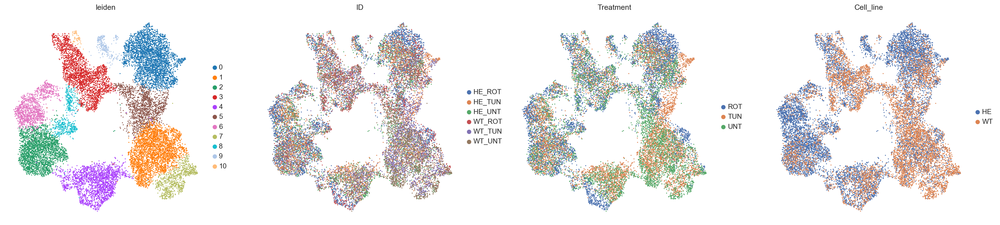

In [ ]:
sc.pl.umap(adata_us, color = ['leiden', 'ID','Treatment','Cell_line'], frameon = False,size = 10)

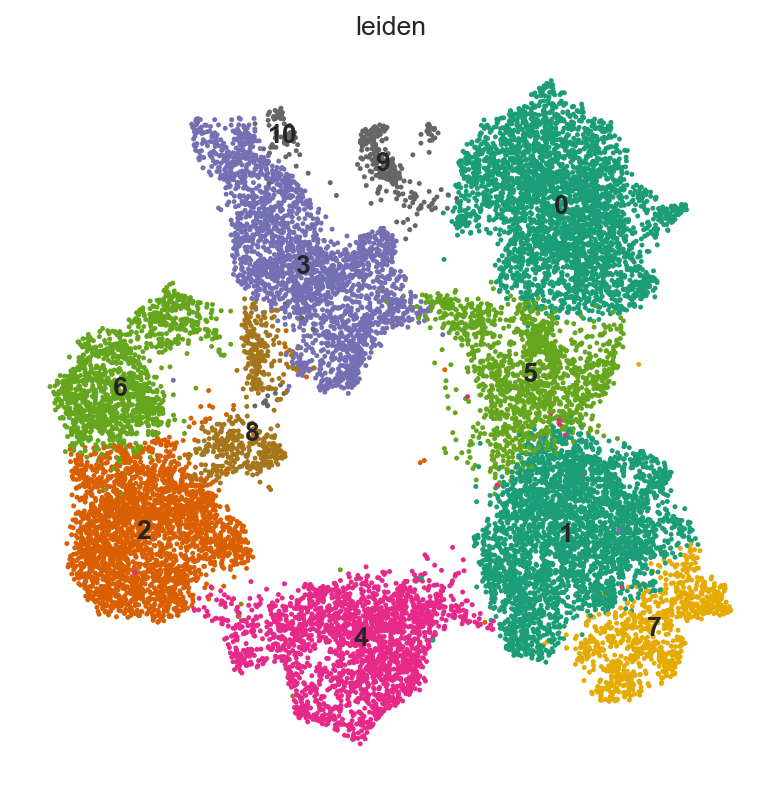

In [ ]:
sc.pl.umap(adata_us, color = ['leiden'], frameon = False,size = 20,
          legend_loc = 'on data', palette = "Dark2")

In [ ]:
sc.tl.rank_genes_groups(adata_us, 'leiden')

In [ ]:
markers = sc.get.rank_genes_groups_df(adata_us, None)
markers = markers[(markers.pvals_adj < 0.05) & (markers.logfoldchanges > .5)]
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,SPINT2,135.988251,2.897212,0.000000,0.000000
1,0,CHGA,128.571915,4.550056,0.000000,0.000000
2,0,NENF,127.253914,2.967783,0.000000,0.000000
3,0,CGA,120.035286,6.656636,0.000000,0.000000
4,0,WFDC2,115.577103,5.396098,0.000000,0.000000
...,...,...,...,...,...,...
175347,10,PPP1R7,2.184156,0.828682,0.032996,0.046972
175348,10,SCGB2A1,2.177918,5.124706,0.033491,0.047650
175349,10,SMIM1,2.176509,1.426394,0.033594,0.047785
175350,10,COX14,2.168590,0.537753,0.034209,0.048608


In [ ]:
markers_scvi = model.differential_expression(groupby = 'leiden')
markers_scvi = markers_scvi[(markers_scvi['is_de_fdr_0.05']) & (markers_scvi.lfc_mean > .5)]
markers_scvi

DE...: 100%|████████████████████████████████████| 11/11 [00:45<00:00,  4.13s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
CALCA,0.9980,0.0020,6.212601,0.005478,0.000102,0.0,0.25,5.680545,5.756633,2.044988,...,57.891265,0.439535,0.792303,0.172070,66.838264,0.758115,True,0 vs Rest,0,Rest
CGA,0.9968,0.0032,5.741396,0.023172,0.000371,0.0,0.25,5.896713,5.987148,2.067075,...,334.021991,2.354601,0.963348,0.525570,342.921521,3.366811,True,0 vs Rest,0,Rest
NENF,0.9968,0.0032,5.741396,0.001894,0.000323,0.0,0.25,2.724874,2.596880,1.012522,...,16.924863,2.376488,0.990226,0.693097,21.158949,3.427666,True,0 vs Rest,0,Rest
RGL3,0.9962,0.0038,5.568944,0.000103,0.000007,0.0,0.25,4.553271,4.542538,1.696591,...,0.740073,0.011494,0.445632,0.009154,0.918511,0.015039,True,0 vs Rest,0,Rest
SMIM22,0.9960,0.0040,5.517450,0.000082,0.000005,0.0,0.25,4.578762,4.586317,1.827318,...,0.661576,0.011425,0.346671,0.007227,0.728647,0.015102,True,0 vs Rest,0,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TIMP4,0.9020,0.0980,2.219647,0.000009,0.000007,0.0,0.25,0.578721,0.635664,1.969074,...,0.000000,0.016682,0.000000,0.014315,0.000000,0.024434,True,10 vs Rest,10,Rest
PSENEN,0.9016,0.0984,2.215130,0.000670,0.000249,0.0,0.25,1.173570,1.266144,1.217655,...,3.288136,1.974639,0.796610,0.716806,8.393157,2.916745,True,10 vs Rest,10,Rest
NFATC1,0.9016,0.0984,2.215130,0.000025,0.000013,0.0,0.25,1.691771,1.437379,1.821397,...,0.084746,0.059513,0.084746,0.048693,0.248656,0.073669,True,10 vs Rest,10,Rest
RASGRF2-AS1,0.9016,0.0984,2.215130,0.000005,0.000003,0.0,0.25,0.856242,0.830671,1.798235,...,0.033898,0.012624,0.033898,0.011666,0.037292,0.016344,True,10 vs Rest,10,Rest


In [ ]:
# Save the marker table as a CSV file
markers.to_csv("markers_em2020_Dec26.csv", index=False)
markers_scvi.to_csv("markers_scvi_em2020_Dec26.csv", index=False)

In [ ]:
#Load if needed
markers = pd.read_csv("markers_em2020_Dec26.csv")
markers_scvi = pd.read_csv("markers_scvi_em2020_Dec26.csv")

In [ ]:
markers[(markers.group == "1") & (markers.logfoldchanges > 4)].sort_values(by="logfoldchanges", ascending=False)

,group,names,scores,logfoldchanges,pvals,pvals_adj
20875,1,ARHGAP36,8.728461,5.303221,4.122687e-18,1.130247e-17
21916,1,RP11-714L20.1,6.533327,4.958044,7.478122e-11,1.606854e-10
17955,1,CRHBP,27.225479,4.883450,9.095918e-147,1.284303e-145
18434,1,ADCY8,19.542620,4.717752,2.218211e-80,1.740320e-79
21335,1,RP11-573J24.1,7.670379,4.492458,2.266589e-14,5.534289e-14
18771,1,PTGFR,16.768126,4.468928,1.592223e-60,9.929381e-60
18905,1,GPR83,15.841674,4.419766,1.886808e-54,1.081003e-53
18055,1,UTS2,25.051407,4.338565,1.376843e-126,1.655242e-125
19346,1,SYTL5,13.565126,4.328973,8.737345e-41,3.997090e-40
19335,1,CHRNA6,13.616751,4.303352,4.434853e-41,2.042720e-40


In [ ]:
markers_scvi[(markers_scvi.group1 =="1") & (markers_scvi.lfc_mean >4)].sort_values(by="lfc_mean", ascending=False)

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
PLPPR4,0.9850,0.0150,4.184591,0.000085,0.000006,0.0,0.25,6.319741,6.581001,3.114822,...,0.325394,0.026130,0.255230,0.022523,0.775613,0.054614,True,1 vs Rest,1,Rest
ONECUT1,0.9836,0.0164,4.093937,0.000054,0.000007,0.0,0.25,5.434517,5.492558,3.205822,...,0.160283,0.021366,0.134857,0.017079,0.379575,0.041399,True,1 vs Rest,1,Rest
RP11-714L20.1,0.9878,0.0122,4.394043,0.000017,0.000001,0.0,0.25,5.078855,5.045570,3.046471,...,0.028001,0.001021,0.016736,0.000817,0.050422,0.001291,True,1 vs Rest,1,Rest
HTR5A,0.9736,0.0264,3.607636,0.000016,0.000002,0.0,0.25,4.784904,4.962733,2.847705,...,0.057934,0.005444,0.056003,0.005444,0.138483,0.012244,True,1 vs Rest,1,Rest
CHRNA6,0.9854,0.0146,4.212025,0.000022,0.000002,0.0,0.25,4.781545,4.810172,2.538612,...,0.075636,0.003947,0.070486,0.003811,0.186312,0.009440,True,1 vs Rest,1,Rest
VSTM2B,0.9668,0.0332,3.371441,0.000033,0.000009,0.0,0.25,4.766484,4.903810,3.543287,...,0.091728,0.018440,0.076279,0.015038,0.193072,0.048441,True,1 vs Rest,1,Rest
GPR83,0.9822,0.0178,4.010596,0.000039,0.000004,0.0,0.25,4.713242,4.873092,2.562490,...,0.113936,0.006805,0.094303,0.005852,0.263753,0.011379,True,1 vs Rest,1,Rest
ZPLD1,0.9784,0.0216,3.813225,0.000038,0.000005,0.0,0.25,4.570686,4.509336,3.132779,...,0.018024,0.002926,0.011587,0.002518,0.035262,0.006401,True,1 vs Rest,1,Rest
POU4F1,0.9668,0.0332,3.371441,0.000028,0.000009,0.0,0.25,4.540207,4.261266,3.569893,...,0.012230,0.031165,0.008046,0.022659,0.031179,0.064988,True,1 vs Rest,1,Rest
PNMA5,0.9858,0.0142,4.240211,0.000078,0.000009,0.0,0.25,4.516194,4.546553,2.438889,...,0.231413,0.015174,0.195687,0.013881,0.561890,0.036391,True,1 vs Rest,1,Rest


In [ ]:
markers_scvi[(markers_scvi.group1 =="1") & (markers_scvi.group2 =="9")].sort_values(by="lfc_mean", ascending=False)

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2


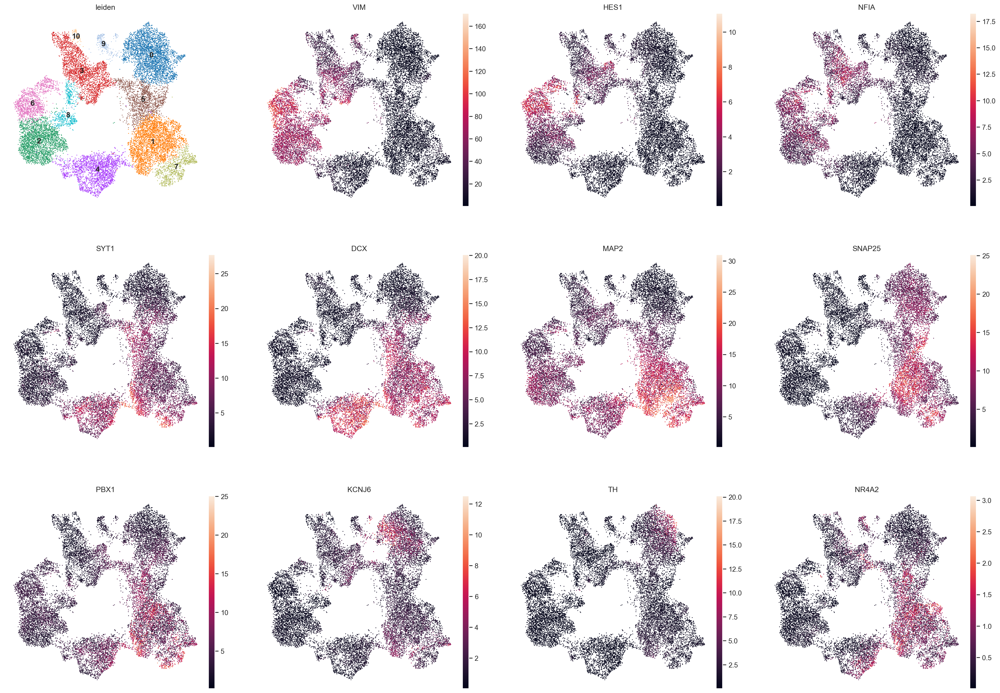

In [ ]:
sc.pl.umap(adata_us, color = ['leiden','VIM','HES1','NFIA',
                              'SYT1','DCX',
                              'MAP2', 'SNAP25',
                              'PBX1','KCNJ6','TH','NR4A2'

                             ], frameon = False,layer = 'scvi_normalized', legend_loc = 'on data')


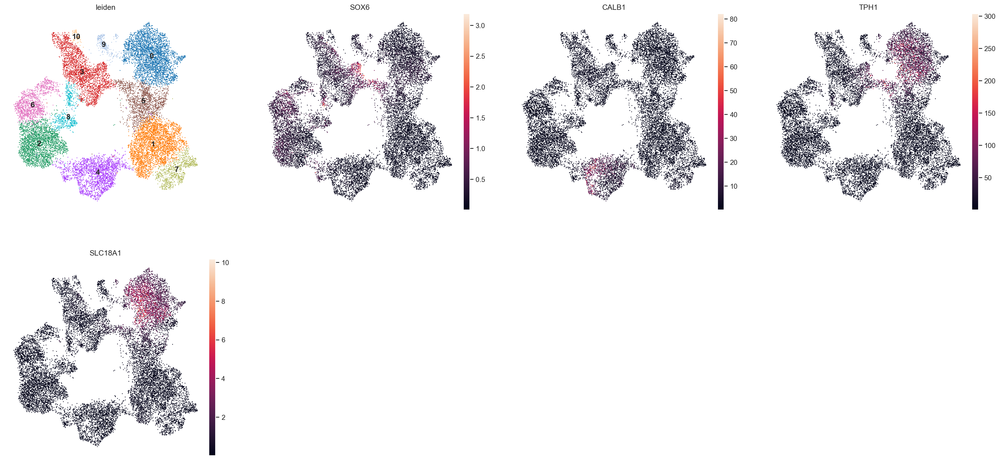

In [ ]:
sc.pl.umap(adata_us, color = ['leiden', 'SOX6','CALB1', 'TPH1', 'SLC18A1'

                             ], frameon = False,layer = 'scvi_normalized', legend_loc = 'on data')


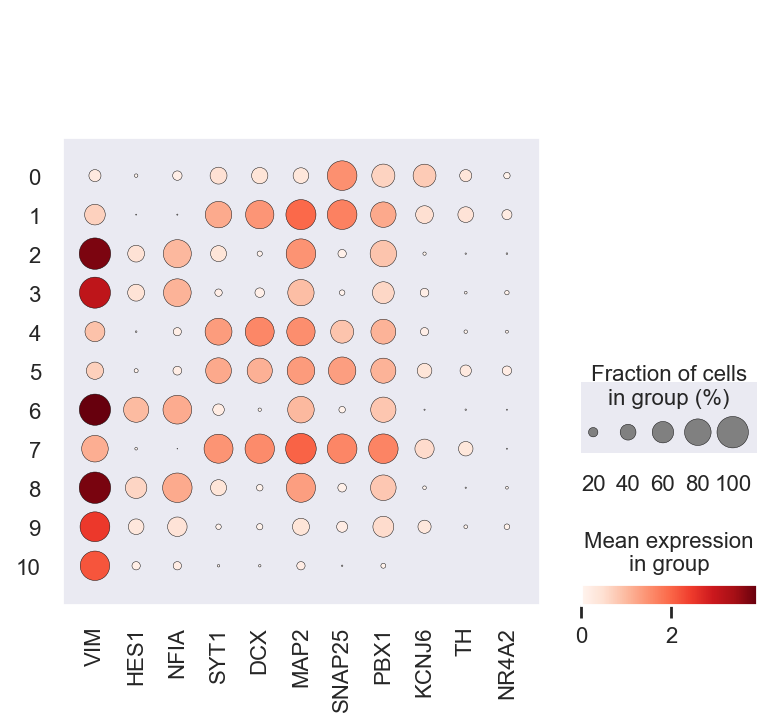

In [ ]:
sc.pl.dotplot(adata_us, var_names = ['VIM','HES1','NFIA',
                              'SYT1','DCX',
                              'MAP2', 'SNAP25',
                              'PBX1','KCNJ6','TH','NR4A2',
                                    ],
             groupby='leiden')

In [ ]:
sc.pl.dotplot(adata_us[(adata_us.obs.leiden.isin(['1','4','5','7','0']))], var_names = ['SOX6', 'TPH1','SLC18A1',
                                                                                        'CALB1',
                                    ],
             groupby='leiden')

In [ ]:
from scipy import stats

In [ ]:
temp = adata_us[(adata_us.obs.leiden.isin(['7'])) & (adata_us.obs.Cell_line.isin(['WT']))]
#temp = da
i = np.where(temp.var_names == 'PSMB8')[0][0]

In [ ]:
temp = adata_us[(adata_us.obs.leiden.isin(['1','4','5','7','0'])) & (adata_us.obs.ID.isin(['WT_UNT']))]
#temp = da
i = np.where(temp.var_names == 'PSMB8')[0][0]

In [ ]:
a = temp[temp.obs.Treatment == 'ROT'].X[:,i]
b = temp[temp.obs.Treatment == 'UNT'].X[:,i]
stats.ttest_ind(a, b,alternative='greater')
stats.mannwhitneyu(a, b,alternative='greater')

MannwhitneyuResult(statistic=5868.0, pvalue=0.7189889755733051)

In [ ]:
a = temp[temp.obs.leiden.isin(['5','0'])].X[:,i]
b = temp[temp.obs.leiden.isin(['1','4','7'])].X[:,i]
stats.ttest_ind(a, b,alternative='greater')
stats.mannwhitneyu(a, b,alternative='greater')

MannwhitneyuResult(statistic=461411.0, pvalue=0.011430156630899526)

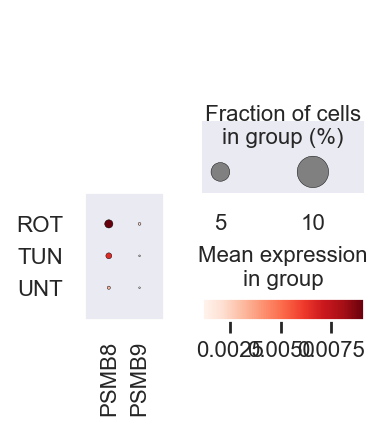

In [ ]:
sc.pl.dotplot(temp, var_names=['PSMB8','PSMB8'], groupby = 'Treatment')

In [ ]:
cell_type = {"0":"DA1",
"1":"DA2",
"2":"Prog2",
"3":"Prog1",
"4":"DA4",
"5":"DA1",
"6":"Prog2",
"7":"DA3",
"8":"Prog2",
"9":"Prog1",
"10":"Prog1"
}

In [ ]:
adata_us.obs['cell_type'] = adata_us.obs.leiden.map(cell_type)

In [ ]:
adata_us

AnnData object with n_obs × n_vars = 17803 × 10000
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cell_type'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'ID_colors', 'rank_genes_groups', 'Treatment_colors', 'Cell_line_colors'
    obsm: '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs', 'X_scVI', 'X_umap'
    layers: 'counts', 'scvi_normalized'
    obsp: 'distances', 'connectivities'

In [ ]:
adata_us.write_h5ad('em2020_annotated_Dec26.h5ad')

# Load and setting

In [1]:
import scanpy as sc
import scvi
import seaborn as sns
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from scipy import stats
import plotnine as p9

In [2]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.1.6.post2


In [3]:
#sc.set_figure_params(figsize=(6, 6), frameon=False)
#sns.set_theme()
torch.set_float32_matmul_precision("high")
#save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

In [4]:
adata = sc.read_h5ad('em2020_annotated_Dec26.h5ad')

In [5]:
model = scvi.model.SCVI.load('model.modelscVI_em2020_Dec26',adata)

INFO     File model.modelscVI_em2020_Dec26/model.pt already downloaded                                             


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


# Analysis

## UMAP plot

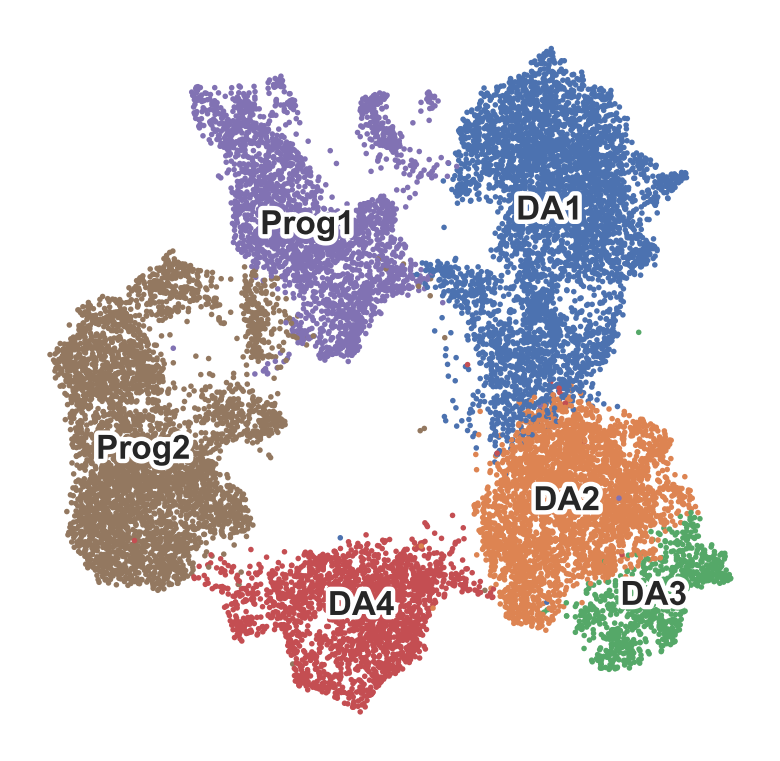

In [ ]:
# Remove the 'cell_type_colors' key
#if 'cell_type_colors' in adata_us.uns:
   # del adata_us.uns['cell_type_colors']

# Re-plot with default colors
sc.pl.umap(adata_us, color='cell_type', legend_loc='on data', size=25,
          legend_fontsize = 15,
          legend_fontweight = 'bold',
          legend_fontoutline=4,
          title = '',
          save = 'em2020_Dec26_Celltype_UMAP.pdf')


In [ ]:
sc.pl.umap(
    adata_us,
    color='cell_type',
    legend_loc='on data',
    size=25,
    legend_fontsize=15,
    legend_fontweight='bold',
    legend_fontoutline=4,
    title='',
    show= False # Do not automatically save
)

# Save the plot manually with high resolution
plt.savefig(
    'em2020_Dec26_Celltype_UMAP.png',
    dpi=2000,  # High DPI for better quality
    bbox_inches='tight',  # Remove unnecessary whitespace
    format='png'  # Save as PNG
)

# Close the figure to prevent display in interactive environments
plt.close()

## Mannwhitneyu

In [ ]:
adata

AnnData object with n_obs × n_vars = 17803 × 10000
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cell_type'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Cell_line_colors', 'ID_colors', 'Treatment_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'connectivities', 'distances'

In [30]:
adata.X = adata.layers['scvi_normalized']

In [31]:
adata.X.max()

3082.242

In [37]:
temp = adata[(adata.obs.cell_type.isin(['DA1','DA2','DA3','DA4'])) & (adata.obs.Cell_line.isin(['WT'])) & (adata.obs.Treatment.isin(['UNT','ROT']))]
#temp = da
i = np.where(temp.var_names == 'PSMB8')[0][0]

In [33]:
a = temp[temp.obs.Treatment == 'ROT'].X[:,i]
b = temp[temp.obs.Treatment == 'UNT'].X[:,i]
#stats.ttest_ind(a, b,alternative='greater')
stats.mannwhitneyu(a, b,alternative='greater')

MannwhitneyuResult(statistic=1076720.0, pvalue=2.1816876640395013e-33)

/var/folders/5w/4gxh3d6x6yj2hxct_tjf1rk80000gn/T/ipykernel_40059/418916160.py:8: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/var/folders/5w/4gxh3d6x6yj2hxct_tjf1rk80000gn/T/ipykernel_40059/418916160.py:11: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



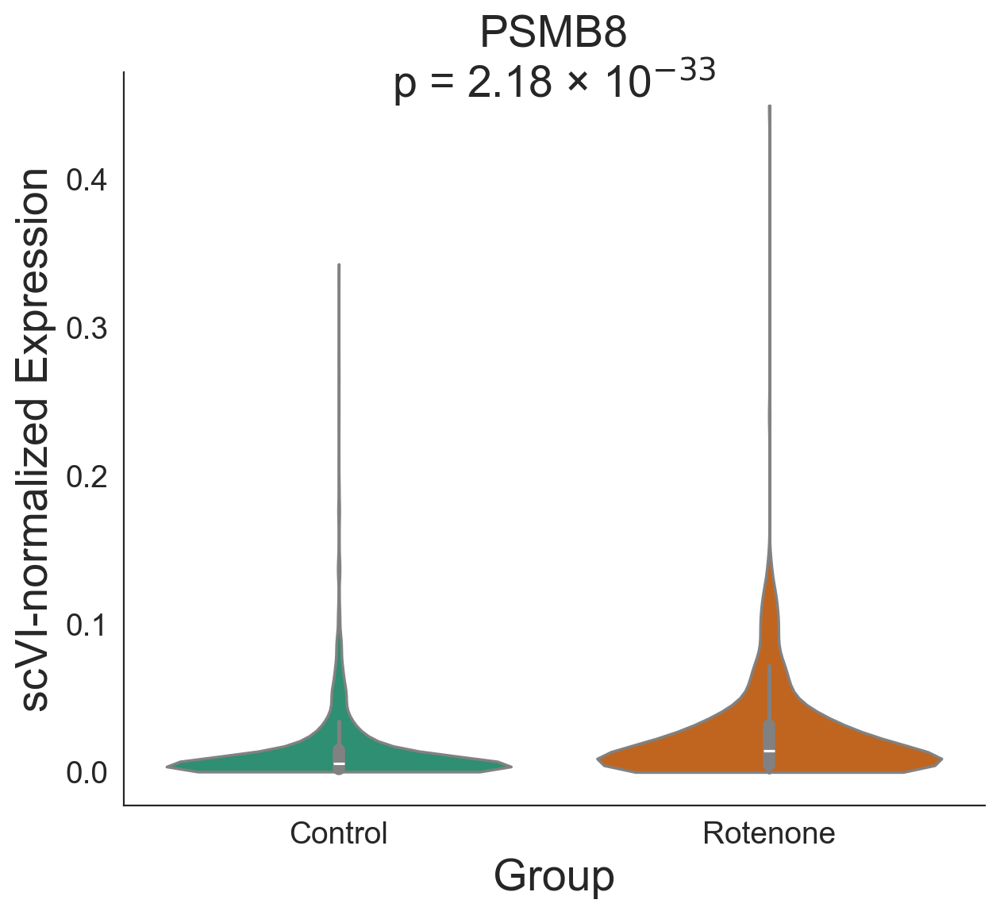

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a clean white background
sns.set_style("white")

# Change the order and rename categories
temp.obs['Treatment'] = temp.obs['Treatment'].cat.reorder_categories(
    ['UNT', 'ROT'], ordered=True  # Define the desired order
)
temp.obs['Treatment'] = temp.obs['Treatment'].replace({'UNT': 'Control', 'ROT': 'Rotenone'})

# Create the figure and axes
fig, ax = plt.subplots(figsize=(7, 6))

# Generate the violin plot with Scanpy
sc.pl.violin(
    temp,
    keys='PSMB8',
    groupby='Treatment',  # Use the reordered and renamed column
    layer='scvi_normalized',
    use_raw=False,
    log=False,
    xlabel='Group',
    ylabel='Expression',
    stripplot=False,
    inner='boxplot',
    palette='Dark2',
    fill=True,
    linecolor='#818181',
    alpha=0.99,
    size=3,
    ax=ax,
    show=False  # Prevent automatic display to allow customization
)

# Remove the spines (the square lines around the plot)
ax.spines['top'].set_visible(False)    # Remove the top spine
ax.spines['right'].set_visible(False)  # Remove the right spine

# Adjust the font size of x and y labels
ax.set_xlabel('Group', fontsize=20)  # Increase font size for x-axis label
ax.set_ylabel('scVI-normalized Expression', fontsize=20)  # Increase font size for y-axis label

# Adjust the tick label size
ax.tick_params(axis='x', labelsize=14)  # Increase font size for x-axis ticks
ax.tick_params(axis='y', labelsize=14)  # Increase font size for y-axis ticks

# Add a label to the plot
ax.text(
    0.5, 0.95,  # Adjusted y-coordinate for better positioning
    "PSMB8\np = 2.18 × 10$^{-33}$",
    fontsize=20,
    ha='center',  # Center horizontally
    va='bottom',  # Align the bottom of the text
    transform=ax.transAxes,  # Use axis-relative coordinates
    linespacing=1,
)

# Save the plot to a file (optional)
plt.savefig("PSMB8_violin_Jan1.pdf", bbox_inches='tight')

# Show the plot
plt.show()


In [39]:
temp =  adata[(adata.obs.cell_type.isin(['DA1','DA2','DA3','DA4'])) & (adata.obs.Cell_line.isin(['WT','HE']))]
i = np.where(temp.var_names == 'PSMB8')[0][0]

In [45]:
a = temp[temp.obs.Cell_line == 'HE'].X[:,i]
b = temp[temp.obs.Cell_line == 'WT'].X[:,i]
#stats.ttest_ind(a, b,alternative='greater')
c = stats.mannwhitneyu(a, b)
if c.pvalue < 10**-300:
    print("The p-value is less than 10^-300.")
else:
    print(f"The p-value is {result.pvalue}, which is not less than 10^-300.")

The p-value is less than 10^-300.


/var/folders/5w/4gxh3d6x6yj2hxct_tjf1rk80000gn/T/ipykernel_40059/4066999922.py:8: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/var/folders/5w/4gxh3d6x6yj2hxct_tjf1rk80000gn/T/ipykernel_40059/4066999922.py:11: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



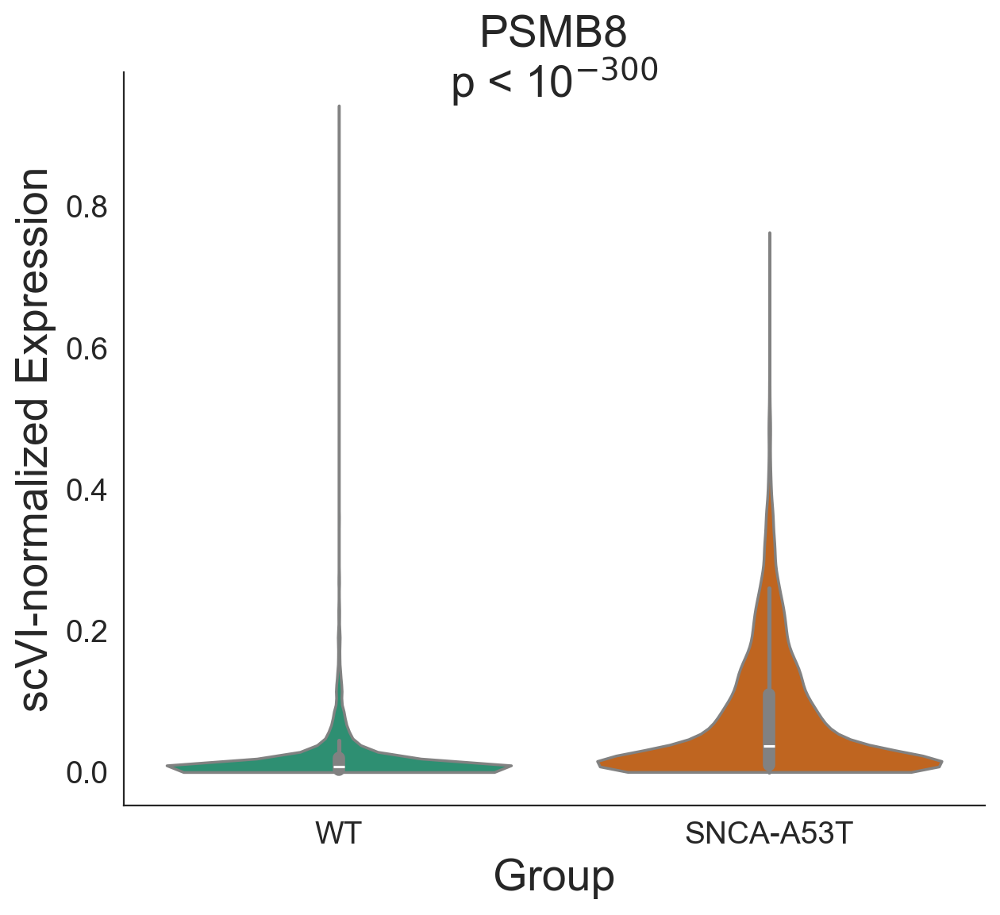

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a clean white background
sns.set_style("white")

# Change the order and rename categories
temp.obs['Cell_line'] = temp.obs['Cell_line'].cat.reorder_categories(
    ['WT', 'HE'], ordered=True  # Define the desired order
)
temp.obs['Cell_line'] = temp.obs['Cell_line'].replace({'WT': 'WT', 'HE': 'SNCA-A53T'})

# Create the figure and axes
fig, ax = plt.subplots(figsize=(7, 6))

# Generate the violin plot with Scanpy
sc.pl.violin(
   temp,
    keys='PSMB8',
    groupby='Cell_line',  # Use the reordered and renamed column
    layer='scvi_normalized',
    use_raw=False,
    log=False,
    xlabel='Group',
    ylabel='Expression',
    stripplot=False,
    inner='boxplot',
    palette='Dark2',
    fill=True,
    linecolor='#818181',
    alpha=0.99,
    size=3,
    ax=ax,
    show=False  # Prevent automatic display to allow customization
)

# Remove the spines (the square lines around the plot)
ax.spines['top'].set_visible(False)    # Remove the top spine
ax.spines['right'].set_visible(False)  # Remove the right spine

# Adjust the font size of x and y labels
ax.set_xlabel('Group', fontsize=20)  # Increase font size for x-axis label
ax.set_ylabel('scVI-normalized Expression', fontsize=20)  # Increase font size for y-axis label

# Adjust the tick label size
ax.tick_params(axis='x', labelsize=14)  # Increase font size for x-axis ticks
ax.tick_params(axis='y', labelsize=14)  # Increase font size for y-axis ticks

# Add a label to the plot
ax.text(
    0.5, 0.95,  # Adjusted y-coordinate for better positioning
    "PSMB8\np < 10$^{-300}$",
    fontsize=20,
    ha='center',  # Center horizontally
    va='bottom',  # Align the bottom of the text
    transform=ax.transAxes,  # Use axis-relative coordinates
    linespacing=1,
)

# Save the plot to a file (optional)
plt.savefig("PSMB8_violin_HEvsWT_Jan1.pdf", bbox_inches='tight')

# Show the plot
plt.show()


In [ ]:
import numpy as np

print("Max value in scvi_normalized:", np.max(temp.layers['scvi_normalized']))
print("Min value in scvi_normalized:", np.min(temp.layers['scvi_normalized']))
print("Summary statistics:", np.percentile(temp.layers['scvi_normalized'], [0, 25, 50, 75, 100]))


Max value in scvi_normalized: 1338.7344
Min value in scvi_normalized: 1.0277477e-12
Summary statistics: [1.02774766e-12 2.20398325e-02 1.14326887e-01 4.79561970e-01
 1.33873438e+03]


In [ ]:
psmb8_values = temp[:, 'PSMB8'].layers['scvi_normalized'].toarray()
print("PSMB8 max value:", np.max(psmb8_values))

PSMB8 max value: 0.44982654


In [ ]:
np.median(psmb8_values)

0.0073458254

## APUPD

In [11]:
ups1 = pd.read_csv('REACTOME_ANTIGEN_PROCESSING_UBIQUITINATION_PROTEASOME_DEGRADATION.v2024.1.Hs.tsv', sep="\t")

In [12]:
# Extract the GENE_SYMBOLS row
gene_symbols_row = ups1.loc[ups1['STANDARD_NAME'] == 'GENE_SYMBOLS']
appp_sig= gene_symbols_row.iloc[0, 1].split(',')

In [40]:
appp_sig

['KLHL13',
 'CDC27',
 'FBXL3',
 'ASB4',
 'MYLIP',
 'PSMB1',
 'UBE3C',
 'PSMC4',
 'RNF14',
 'UFL1',
 'UBR2',
 'UBA6',
 'RNF19A',
 'CUL3',
 'PSMA4',
 'CUL7',
 'NEDD4L',
 'ANAPC4',
 'CUL1',
 'UNKL',
 'RNF4',
 'BTBD1',
 'ASB1',
 'PSME4',
 'NEDD4',
 'RNF126',
 'LNX1',
 'UBE2D1',
 'FBXW11',
 'KLHL20',
 'UBE2A',
 'UBE2K',
 'ITCH',
 'UBE2D4',
 'KEAP1',
 'UBA5',
 'HACE1',
 'HUWE1',
 'PSMC5',
 'KLHL42',
 'ANAPC5',
 'PSME1',
 'HECTD1',
 'CDC23',
 'PSMD5',
 'PSMD8',
 'FBXL19',
 'CDC34',
 'KLHL22',
 'FBXO7',
 'RBX1',
 'TRIM9',
 'PSMC6',
 'PSMA3',
 'ASB2',
 'PSMC1',
 'PSMB5',
 'PSMA6',
 'PSME2',
 'PSMA7',
 'PSMD10',
 'ASB9',
 'MGRN1',
 'PSMD7',
 'FBXO31',
 'STUB1',
 'ELOB',
 'HERC1',
 'UBE2W',
 'FZR1',
 'PSMA2',
 'UBE2R2',
 'FBXW4',
 'FBXL15',
 'CUL2',
 'UBE2S',
 'FBXL20',
 'PSMD3',
 'TRIM37',
 'BLMH',
 'PSMD11',
 'SMURF2',
 'WSB1',
 'UBE2D3',
 'KLHL2',
 'FBXW7',
 'KLHL5',
 'ZBTB16',
 'UBE4A',
 'PSMD9',
 'SPSB2',
 'FBXO9',
 'FBXL4',
 'RNF130',
 'LNPEP',
 'SKP1',
 'UBE3A',
 'RNF7',
 'CBLB',
 'PSMD14'

# DE _ Volcano plot

In [9]:
adata.X = adata.layers['scvi_normalized']

In [10]:
adata.layers['scvi_normalized'].max()

3082.242

In [11]:
adata.X.max()

3082.242

In [12]:
scvi.settings.seed=0

INFO: Seed set to 0
INFO:lightning.fabric.utilities.seed:Seed set to 0


In [34]:
neu_dif_WT_ROT = model.differential_expression(
    idx1 = [(adata.obs['cell_type'].isin(['DA1','DA2','DA3','DA4'])) & (adata.obs.Cell_line == 'WT')  & (adata.obs.Treatment == 'ROT')],
    idx2 = [(adata.obs['cell_type'].isin(["DA1",'DA2','DA3','DA4']))  & (adata.obs.Cell_line == 'WT')  & (adata.obs.Treatment == 'UNT')])

DE...:   0%|          | 0/1 [00:00<?, ?it/s]

In [35]:
neu_dif_WT_ROT["log10_pscore"] = np.log10(neu_dif_WT_ROT["proba_not_de"])

In [ ]:
a = model.differential_expression(
    idx1 = [(adata.obs['cell_type'].isin(['DA1','DA2','DA3','DA4'])) & (adata.obs.Cell_line == 'HE')],
    idx2 = [(adata.obs['cell_type'].isin(["DA1",'DA2','DA3','DA4']))  & (adata.obs.Cell_line == 'WT')])

In [19]:
a["log10_pscore"] = np.log10(a["proba_not_de"])
a['gene'] = a.index
a['label'] = a.apply(
    lambda row: row['gene'] if row['is_de_fdr_0.05'] and row['gene'] in appp_sig else '', axis=1
)
print("Changes",a[(a['is_de_fdr_0.05']== True)].shape)
print("Upregulation",a[(a['is_de_fdr_0.05']== True) & (a['lfc_mean']>0)].shape)
print("Downregulation",a[(a['is_de_fdr_0.05']== True) & (a['lfc_mean']<0)].shape)
a.to_csv("scVI_DE_HEvsWT_Jan1.csv", index= True)

Changes (461, 22)
Upregulation (350, 22)
Downregulation (111, 22)


In [41]:
neu_dif_WT_ROT['gene'] = neu_dif_WT_ROT.index
neu_dif_WT_ROT['label'] = neu_dif_WT_ROT.apply(
    lambda row: row['gene'] if row['is_de_fdr_0.05'] and row['gene'] in appp_sig else '', axis=1
)

In [42]:
neu_dif_WT_ROT.to_csv("scVI_DE_ROTVSNO_WT_Jan1.csv", index=False)

In [46]:
neu_dif_WT_ROT.shape

(10000, 22)

In [43]:
neu_dif_WT_ROT_sig = neu_dif_WT_ROT[neu_dif_WT_ROT['is_de_fdr_0.05'] == True].copy()

In [45]:
neu_dif_WT_ROT_sig.shape

(773, 22)

In [47]:
neu_dif_WT_ROT_sig[neu_dif_WT_ROT_sig['lfc_mean']>0].shape

(433, 22)

In [48]:
neu_dif_WT_ROT_sig[neu_dif_WT_ROT_sig['lfc_mean']<0].shape

(340, 22)

In [50]:
neu_dif_WT_ROT_sig.to_csv("scVI_DE_ROTVSNO_WT_Jan1_SIG.csv", index=True)

In [7]:
from plotnine import ggplot, aes, geom_point, geom_label, labs, scale_color_manual, theme
from plotnine.themes.elements import element_text


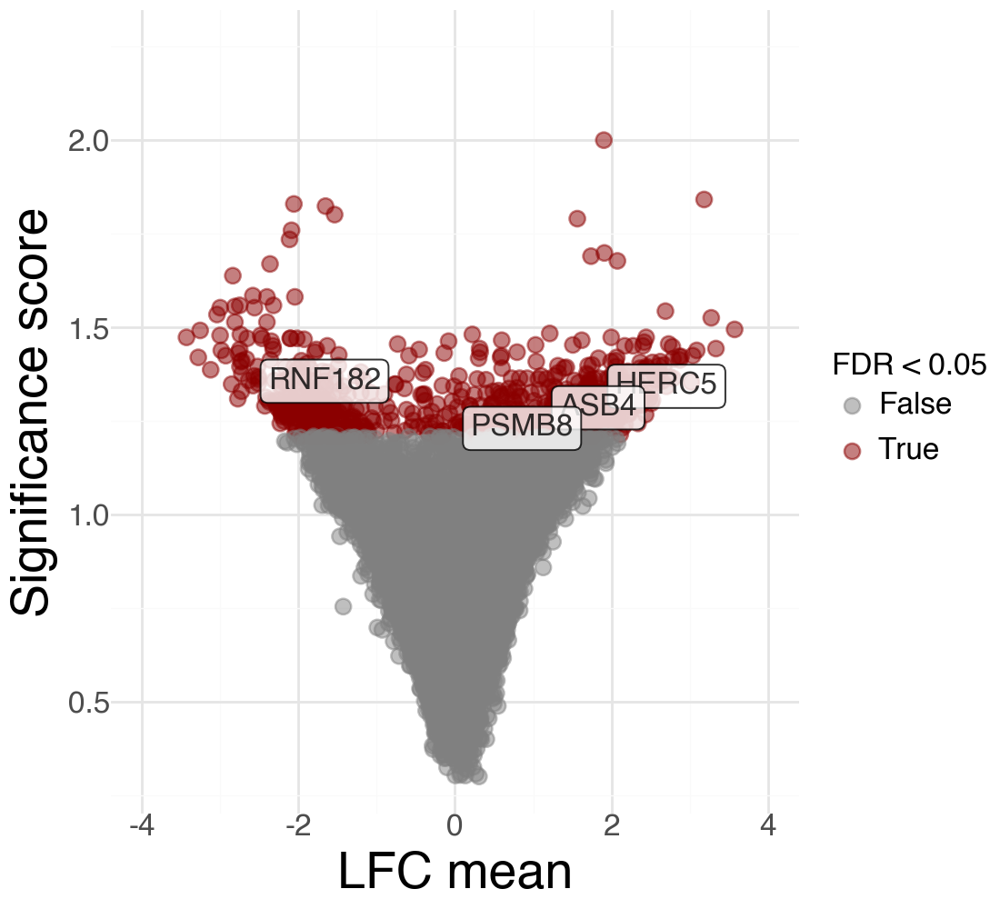

In [ ]:

plotneuWTdif = (
    ggplot(neu_dif_WT_ROT, aes(x="lfc_mean", y="-log10_pscore", color="is_de_fdr_0.05"))
    + geom_point(alpha=0.5, size=3)  # Apply transparency to all points
    + scale_color_manual(
        values={True: "darkred", False: "gray"}
    )  # Map TRUE to darkred and FALSE to gray
    + p9.ylim(0.3, 2.25
             )
    + p9.xlim(-4, 4)
    + labs(
        x="LFC mean",
        y="Significance score",
        color="FDR < 0.05"
    )
    + geom_label(
        data=neu_dif_WT_ROT[neu_dif_WT_ROT['label'] != ''],
        mapping=aes(label='label'),  # Use the new column 'label'
        size=12, color="black", fill="white", alpha=0.8
    )
    +p9.theme_minimal()
    + theme(
        axis_title_x=element_text(size=20),  # Increase font size for X-axis title
        axis_title_y=element_text(size=20),  # Increase font size for Y-axis title
        axis_text_x=element_text(size=12),   # Increase font size for X-axis tick labels
        axis_text_y=element_text(size=12),   # Increase font size for Y-axis tick labels
        legend_title=element_text(size=12),  # Increase font size for legend title
        legend_text=element_text(size=12),   # Increase font size for legend text
        figure_size=(5.5, 5)
    )

)

# Render the plot
plotneuWTdif


In [8]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['font.family'] = ['Helvetica']

In [ ]:
# Save the plot to a PNG file with DPI=2000
plotneuWTdif.save(
    filename="Vol_scVI_All_DA_Dec26_2.png",
    dpi=2000,
    width=5.5,
    height=5,
    units="in"
)

/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 2 rows containing missing values.


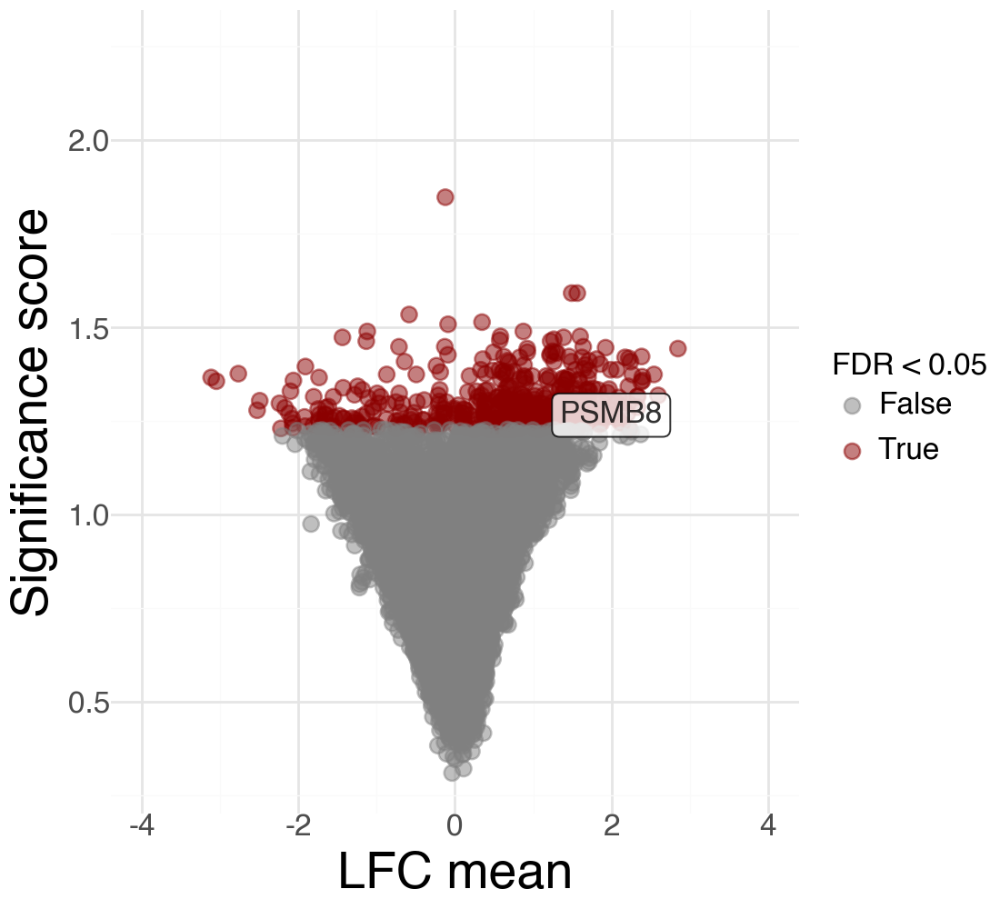

In [14]:
# HE vs WT (all treat-no)
plotneuhevswt = (
    ggplot(a, aes(x="lfc_mean", y="-log10_pscore", color="is_de_fdr_0.05"))
    + geom_point(alpha=0.5, size=3)  # Apply transparency to all points
    + scale_color_manual(
        values={True: "darkred", False: "gray"}
    )  # Map TRUE to darkred and FALSE to gray
    + p9.ylim(0.3, 2.25
             )
    + p9.xlim(-4, 4)
    + labs(
        x="LFC mean",
        y="Significance score",
        color="FDR < 0.05"
    )
    + geom_label(
        data=a[a['label']== 'PSMB8'],
        mapping=aes(label='label'),  # Use the new column 'label'
        size=12, color="black", fill="white", alpha=0.8
    )
    +p9.theme_minimal()

    + theme(
        axis_title_x=element_text(size=20),  # Increase font size for X-axis title
        axis_title_y=element_text(size=20),  # Increase font size for Y-axis title
        axis_text_x=element_text(size=12),   # Increase font size for X-axis tick labels
        axis_text_y=element_text(size=12),   # Increase font size for Y-axis tick labels
        legend_title=element_text(size=12),  # Increase font size for legend title
        legend_text=element_text(size=12),   # Increase font size for legend text
        figure_size=(5.5, 5)
    )

)

# Render the plot
plotneuhevswt

In [15]:
# Save the plot to a PNG file with DPI=2000
plotneuhevswt.save(
    filename="Vol_scVI_All_DA_HEvsWT_Jan1.png",
    dpi=2000,
    width=5.5,
    height=5,
    units="in"
)

/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/ggplot.py:606: PlotnineWarning: Saving 5.5 x 5 in image.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/ggplot.py:607: PlotnineWarning: Filename: Vol_scVI_All_DA_HEvsWT_Jan1.png
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 2 rows containing missing values.
